# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [85]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from chart_studio.plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [86]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [87]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [88]:
#project_data = project_data.sample(n=5000)

In [89]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [90]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [91]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

## 1.2 preprocessing of `project_subject_categories`

In [92]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

#from collections import Counter
#my_counter = Counter()
#for word in project_data['clean_categories'].values:
#    my_counter.update(word.split())
#
#cat_dict = dict(my_counter)
#sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [93]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
#my_counter = Counter()
#for word in project_data['clean_subcategories'].values:
#    my_counter.update(word.split())
#    
#sub_cat_dict = dict(my_counter)
#sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [94]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)

In [95]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,My students need STEM kits to learn critical s...,53,1,725.05,4,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,My students need Boogie Boards for quiet senso...,4,1,213.03,8,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


In [96]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [97]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)

I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement these kits: magnets, motion, si

In [98]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [99]:
sent = decontracted(project_data['essay'].values[200])
print(sent)
print("="*50)

Learning to read is such an amazing skill students are developing in our classroom. We are looking to build our classroom library full of books that each child can read at their own level.Our classroom consists of 25 wonderful kindergarteners in our Title One magnet school. Every year they find the joy and magic in reading!! This year a change a change in curriculum put in place in our classroom has placed my readers at a higher level of achievement than previous classes I have taught. We are eager to have more resources at their fingertips for individual and small group learning.In our classroom our children will be able to choose multiple books at their individual level to read on their own time. These books will help support the skills they are developing during guided reading time. The children will be able to choose a book at their reading level to read with our wonderful NAU student teachers instead of having a story chosen for them. Their ability to choose will further encourage

In [100]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

Learning to read is such an amazing skill students are developing in our classroom. We are looking to build our classroom library full of books that each child can read at their own level.Our classroom consists of 25 wonderful kindergarteners in our Title One magnet school. Every year they find the joy and magic in reading!! This year a change a change in curriculum put in place in our classroom has placed my readers at a higher level of achievement than previous classes I have taught. We are eager to have more resources at their fingertips for individual and small group learning.In our classroom our children will be able to choose multiple books at their individual level to read on their own time. These books will help support the skills they are developing during guided reading time. The children will be able to choose a book at their reading level to read with our wonderful NAU student teachers instead of having a story chosen for them. Their ability to choose will further encourage

In [101]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

Learning to read is such an amazing skill students are developing in our classroom We are looking to build our classroom library full of books that each child can read at their own level Our classroom consists of 25 wonderful kindergarteners in our Title One magnet school Every year they find the joy and magic in reading This year a change a change in curriculum put in place in our classroom has placed my readers at a higher level of achievement than previous classes I have taught We are eager to have more resources at their fingertips for individual and small group learning In our classroom our children will be able to choose multiple books at their individual level to read on their own time These books will help support the skills they are developing during guided reading time The children will be able to choose a book at their reading level to read with our wonderful NAU student teachers instead of having a story chosen for them Their ability to choose will further encourage their l

In [102]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [103]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 109248/109248 [03:17<00:00, 552.17it/s]


In [104]:
# after preprocesing
preprocessed_essays[200]

'learning read amazing skill students developing classroom looking build classroom library full books child read level classroom consists 25 wonderful kindergarteners title one magnet school every year find joy magic reading year change change curriculum put place classroom placed readers higher level achievement previous classes taught eager resources fingertips individual small group learning classroom children able choose multiple books individual level read time books help support skills developing guided reading time children able choose book reading level read wonderful nau student teachers instead story chosen ability choose encourage love reading teaching title one school means many students live poverty line reading amazing way foster love learning help students find way make better life reading magical time kids able give students would amazing blessing'

In [105]:
project_data['essay'] = preprocessed_essays

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [106]:
# similarly you can preprocess the titles also

In [107]:
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_titles.append(sent.lower().strip())

100%|████████████████████████████████████████████████████████████████████████| 109248/109248 [00:11<00:00, 9376.63it/s]


In [108]:
project_data['project_title'] = preprocessed_titles

## 1.5 Preparing data for models

In [109]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_grade_category', 'project_title',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'price', 'quantity', 'clean_categories', 'clean_subcategories',
       'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

In [110]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,engineering steam primary classroom,My students need STEM kits to learn critical s...,53,1,725.05,4,Math_Science,AppliedSciences Health_LifeScience,fortunate enough use fairy tale stem kits clas...
1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,sensory tools focus,My students need Boogie Boards for quiet senso...,4,1,213.03,8,SpecialNeeds,SpecialNeeds,imagine 8 9 years old third grade classroom se...


In [111]:
X = project_data.drop(['project_is_approved','Unnamed: 0','id','teacher_id','Date','project_resource_summary','quantity'],axis=1)
y = project_data['project_is_approved']

In [112]:
from sklearn.model_selection import train_test_split

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.2, random_state = 42)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, stratify = y_train, test_size = 0.2, random_state = 42)

In [114]:
print(X_train.shape)
print(X_cv.shape)
print(X_test.shape)
print(y_train.shape)
print(y_cv.shape)
print(y_test.shape)

(69918, 9)
(17480, 9)
(21850, 9)
(69918,)
(17480,)
(21850,)


### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

In [115]:
tfidf_features = []

In [116]:
my_counter = Counter()
for word in X_train['clean_categories'].values:
    my_counter.update(word.split())
    
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))

In [117]:
# we use count vectorizer to convert the values into one 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
categories_one_hot_train = vectorizer.fit_transform(X_train['clean_categories'].values)
categories_one_hot_cv = vectorizer.transform(X_cv['clean_categories'].values)
categories_one_hot_test = vectorizer.transform(X_test['clean_categories'].values)
print(vectorizer.get_feature_names())
tfidf_features.extend(vectorizer.get_feature_names())
print("Shape of matrix after one hot encodig train ",categories_one_hot_train.shape)
print("Shape of matrix after one hot encodig cv ",categories_one_hot_cv.shape)
print("Shape of matrix after one hot encodig test ",categories_one_hot_test.shape)

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encodig train  (69918, 9)
Shape of matrix after one hot encodig cv  (17480, 9)
Shape of matrix after one hot encodig test  (21850, 9)


In [118]:
my_counter = Counter()
for word in X_train['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

In [119]:
# we use count vectorizer to convert the values into one 
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
sub_categories_one_hot_train = vectorizer.fit_transform(X_train['clean_subcategories'].values)
sub_categories_one_hot_cv = vectorizer.transform(X_cv['clean_subcategories'].values)
sub_categories_one_hot_test = vectorizer.transform(X_test['clean_subcategories'].values)
print(vectorizer.get_feature_names())
tfidf_features.extend(vectorizer.get_feature_names())
print("Shape of matrix after one hot encodig train ",sub_categories_one_hot_train.shape)
print("Shape of matrix after one hot encodig cv",sub_categories_one_hot_cv.shape)
print("Shape of matrix after one hot encodig test",sub_categories_one_hot_test.shape)

['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'History_Geography', 'Music', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix after one hot encodig train  (69918, 30)
Shape of matrix after one hot encodig cv (17480, 30)
Shape of matrix after one hot encodig test (21850, 30)


In [120]:
# you can do the similar thing with state, teacher_prefix and project_grade_category also

In [121]:
state_count = X_train['school_state'].value_counts()
state_count_dict = dict(state_count)
sorted_state_count_dict = dict(sorted(state_count_dict.items(), key=lambda kv: kv[1]))

# we use count vectorizer to convert the values into one hot encoded features
vectorizer = CountVectorizer(vocabulary=list(sorted_state_count_dict.keys()), lowercase=False, binary=True)
school_state_one_hot_train = vectorizer.fit_transform(X_train['school_state'].values)
school_state_one_hot_cv = vectorizer.transform(X_cv['school_state'].values)
school_state_one_hot_test = vectorizer.transform(X_test['school_state'].values)
print(vectorizer.get_feature_names())
tfidf_features.extend(vectorizer.get_feature_names())
print("Shape of matrix after one hot encoding train ",school_state_one_hot_train.shape)
print("Shape of matrix after one hot encoding cv ",school_state_one_hot_cv.shape)
print("Shape of matrix after one hot encoding test ",school_state_one_hot_test.shape)

['VT', 'WY', 'ND', 'MT', 'SD', 'RI', 'NE', 'AK', 'NH', 'DE', 'ME', 'HI', 'WV', 'DC', 'NM', 'KS', 'IA', 'ID', 'AR', 'CO', 'OR', 'MN', 'KY', 'MS', 'NV', 'MD', 'CT', 'AL', 'UT', 'TN', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'WA', 'MA', 'LA', 'OH', 'MO', 'IN', 'PA', 'MI', 'SC', 'GA', 'IL', 'NC', 'FL', 'NY', 'TX', 'CA']
Shape of matrix after one hot encoding train  (69918, 51)
Shape of matrix after one hot encoding cv  (17480, 51)
Shape of matrix after one hot encoding test  (21850, 51)


In [122]:
teacher_prefix_count = X_train['teacher_prefix'].value_counts()
teacher_prefix_dict = dict(teacher_prefix_count)
sorted_teacher_prefix_dict = dict(sorted(teacher_prefix_dict.items(), key=lambda kv: kv[1]))

vectorizer = CountVectorizer(vocabulary=list(sorted_teacher_prefix_dict.keys()), lowercase=False, binary=True)
teacher_prefix_one_hot_train = vectorizer.fit_transform(X_train['teacher_prefix'].apply(lambda x: np.str_(x)).values)
teacher_prefix_one_hot_cv = vectorizer.transform(X_cv['teacher_prefix'].apply(lambda x: np.str_(x)).values)
teacher_prefix_one_hot_test = vectorizer.transform(X_test['teacher_prefix'].apply(lambda x: np.str_(x)).values)
print(vectorizer.get_feature_names())
tfidf_features.extend(vectorizer.get_feature_names())
print("Shape of matrix after one hot encoding train",teacher_prefix_one_hot_train.shape)
print("Shape of matrix after one hot encoding cv",teacher_prefix_one_hot_cv.shape)
print("Shape of matrix after one hot encoding test",teacher_prefix_one_hot_test.shape)

['Dr.', 'Teacher', 'Mr.', 'Ms.', 'Mrs.']
Shape of matrix after one hot encoding train (69918, 5)
Shape of matrix after one hot encoding cv (17480, 5)
Shape of matrix after one hot encoding test (21850, 5)


In [123]:
project_grade_count = X_train['project_grade_category'].value_counts()
project_grade_dict = dict(project_grade_count)
sorted_project_grade_dict = dict(sorted(project_grade_dict.items(), key=lambda kv: kv[1]))

vectorizer = CountVectorizer(vocabulary=list(sorted_project_grade_dict.keys()), lowercase=False, binary=True)
project_grade_one_hot_train = vectorizer.fit_transform(X_train['project_grade_category'].values)
project_grade_one_hot_cv = vectorizer.transform(X_cv['project_grade_category'].values)
project_grade_one_hot_test = vectorizer.transform(X_test['project_grade_category'].values)
print(vectorizer.get_feature_names())
tfidf_features.extend(vectorizer.get_feature_names())
print("Shape of matrix after one hot encoding train ",project_grade_one_hot_train.shape)
print("Shape of matrix after one hot encoding cv ",project_grade_one_hot_cv.shape)
print("Shape of matrix after one hot encoding test ",project_grade_one_hot_test.shape)

['Grades 9-12', 'Grades 6-8', 'Grades 3-5', 'Grades PreK-2']
Shape of matrix after one hot encoding train  (69918, 4)
Shape of matrix after one hot encoding cv  (17480, 4)
Shape of matrix after one hot encoding test  (21850, 4)


### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

In [124]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
text_bow_train= vectorizer.fit_transform(X_train['essay'].values)
text_bow_cv= vectorizer.transform(X_cv['essay'].values)
text_bow_test= vectorizer.transform(X_test['essay'].values)
print("Shape of matrix after one hot encoding train ",text_bow_train.shape)
print("Shape of matrix after one hot encoding cv ",text_bow_cv.shape)
print("Shape of matrix after one hot encoding test ",text_bow_test.shape)

Shape of matrix after one hot encoding train  (69918, 13829)
Shape of matrix after one hot encoding cv  (17480, 13829)
Shape of matrix after one hot encoding test  (21850, 13829)


In [125]:
# you can vectorize the title also 
# before you vectorize the title make sure you preprocess it

In [126]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
title_bow_train= vectorizer.fit_transform(X_train['project_title'].values)
title_bow_cv= vectorizer.transform(X_cv['project_title'].values)
title_bow_test= vectorizer.transform(X_test['project_title'].values)
print("Shape of matrix after one hot encoding train ",title_bow_train.shape)
print("Shape of matrix after one hot encoding cv ",   title_bow_cv.shape)
print("Shape of matrix after one hot encoding test ", title_bow_test.shape)

Shape of matrix after one hot encoding train  (69918, 2557)
Shape of matrix after one hot encoding cv  (17480, 2557)
Shape of matrix after one hot encoding test  (21850, 2557)


#### 1.5.2.2 TFIDF vectorizer

In [127]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
text_tfidf_train = vectorizer.fit_transform(X_train['essay'].values)
text_tfidf_cv = vectorizer.transform(X_cv['essay'].values)
text_tfidf_test = vectorizer.transform(X_test['essay'].values)
tfidf_features.extend(vectorizer.get_feature_names())
print("Shape of matrix after one hot encoding train",text_tfidf_train.shape)
print("Shape of matrix after one hot encoding cv",   text_tfidf_cv.shape)
print("Shape of matrix after one hot encoding test", text_tfidf_test.shape)

Shape of matrix after one hot encoding train (69918, 13829)
Shape of matrix after one hot encoding cv (17480, 13829)
Shape of matrix after one hot encoding test (21850, 13829)


In [128]:
vectorizer = TfidfVectorizer(min_df=10)
title_tfidf_train= vectorizer.fit_transform(X_train['project_title'].values)
title_tfidf_cv= vectorizer.transform(X_cv['project_title'].values)
title_tfidf_test= vectorizer.transform(X_test['project_title'].values)
tfidf_features.extend(vectorizer.get_feature_names())
print("Shape of matrix after one hot encoding train ",title_tfidf_train.shape)
print("Shape of matrix after one hot encoding cv ",   title_tfidf_cv.shape)
print("Shape of matrix after one hot encoding test ", title_tfidf_test.shape)

Shape of matrix after one hot encoding train  (69918, 2557)
Shape of matrix after one hot encoding cv  (17480, 2557)
Shape of matrix after one hot encoding test  (21850, 2557)


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [129]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [130]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [131]:
# average Word2Vec
# compute average word2vec for each review.
def avg_w2v(data):
    avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(data.values): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if word in glove_words:
                vector += model[word]
                cnt_words += 1
        if cnt_words != 0:
            vector /= cnt_words
        avg_w2v_vectors.append(vector)
    return avg_w2v_vectors

In [132]:
text_avg_w2v_train = avg_w2v(X_train['essay'])
text_avg_w2v_cv = avg_w2v(X_cv['essay'])
text_avg_w2v_test = avg_w2v(X_test['essay'])

100%|██████████████████████████████████████████████████████████████████████████| 21850/21850 [00:17<00:00, 1251.63it/s]


In [133]:
print("(",str(len(text_avg_w2v_train)),",",str(len(text_avg_w2v_train[0])),")")
print("(",str(len(text_avg_w2v_cv)),",",str(len(text_avg_w2v_cv[0])),")")
print("(",str(len(text_avg_w2v_test)),",",str(len(text_avg_w2v_test[0])),")")

( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )


In [134]:
title_avg_w2v_train = avg_w2v(X_train['project_title'])
title_avg_w2v_cv = avg_w2v(X_cv['project_title'])
title_avg_w2v_test = avg_w2v(X_test['project_title'])
print("(",str(len(title_avg_w2v_train)),",",str(len(title_avg_w2v_train[0])),")")
print("(",str(len(title_avg_w2v_cv)),",",   str(len(title_avg_w2v_cv[0])),")")
print("(",str(len(title_avg_w2v_test)),",", str(len(title_avg_w2v_test[0])),")")

100%|█████████████████████████████████████████████████████████████████████████| 21850/21850 [00:01<00:00, 21223.36it/s]

( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )


#### 1.5.2.3 Using Pretrained Models: TFIDF weighted W2V

In [135]:
def tfidf_w2v(training_data, test_data):
    # S = ["abc def pqr", "def def def abc", "pqr pqr def"]
    tfidf_model = TfidfVectorizer()
    tfidf_model.fit(training_data.values)
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
    tfidf_words = set(tfidf_model.get_feature_names())

    # average Word2Vec
    # compute average word2vec for each review.
    tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(test_data.values): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        tfidf_w2v_vectors.append(vector)
    return tfidf_w2v_vectors

In [136]:
text_tfidf_w2v_train = tfidf_w2v(X_train['essay'],X_train['essay'])
text_tfidf_w2v_cv    = tfidf_w2v(X_train['essay'],X_cv['essay'])
text_tfidf_w2v_test  = tfidf_w2v(X_train['essay'],X_test['essay'])
print("(",str(len(text_tfidf_w2v_train)),",",str(len(text_tfidf_w2v_train[0])),")")
print("(",str(len(text_tfidf_w2v_cv)),",",   str(len(text_tfidf_w2v_cv[0])),")")
print("(",str(len(text_tfidf_w2v_test)),",", str(len(text_tfidf_w2v_test[0])),")")

100%|███████████████████████████████████████████████████████████████████████████| 21850/21850 [02:36<00:00, 139.74it/s]


( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )


In [137]:
# Similarly you can vectorize for title also

In [138]:
title_tfidf_w2v_train = tfidf_w2v(X_train['project_title'],X_train['project_title'])
title_tfidf_w2v_cv    = tfidf_w2v(X_train['project_title'],X_cv['project_title'])
title_tfidf_w2v_test  = tfidf_w2v(X_train['project_title'],X_test['project_title'])
print("(",str(len(title_tfidf_w2v_train)),",",str(len(title_tfidf_w2v_train[0])),")")
print("(",str(len(title_tfidf_w2v_cv)),",",   str(len(title_tfidf_w2v_cv[0])),")")
print("(",str(len(title_tfidf_w2v_test)),",", str(len(title_tfidf_w2v_test[0])),")")

100%|██████████████████████████████████████████████████████████████████████████| 21850/21850 [00:03<00:00, 7109.06it/s]


( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )


### 1.5.3 Vectorizing Numerical features

In [139]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
#price_scalar.fit(project_data['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
#print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
price_standardized_train = price_scalar.fit_transform(X=X_train['price'].values.reshape(-1, 1))
price_standardized_cv    = price_scalar.transform(X=X_cv['price'].values.reshape(-1, 1))
price_standardized_test  = price_scalar.transform(X=X_test['price'].values.reshape(-1, 1))
tfidf_features.insert(len(tfidf_features),'price')

In [140]:
print("(",str(len(price_standardized_train)),",",str(len(price_standardized_train[0])),")")
print("(",str(len(price_standardized_cv)),",",   str(len(price_standardized_cv[0])),")")
print("(",str(len(price_standardized_test)),",", str(len(price_standardized_test[0])),")")

( 69918 , 1 )
( 17480 , 1 )
( 21850 , 1 )


In [141]:
pre_proj_scalar = StandardScaler()
pre_proj_standardized_train = pre_proj_scalar.fit_transform(X=X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
pre_proj_standardized_cv    = pre_proj_scalar.transform(X=X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
pre_proj_standardized_test  = pre_proj_scalar.transform(X=X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
print("(",str(len(pre_proj_standardized_train)),",",str(len(pre_proj_standardized_train[0])),")")
print("(",str(len(pre_proj_standardized_cv)),",",   str(len(pre_proj_standardized_cv[0])),")")
print("(",str(len(pre_proj_standardized_test)),",", str(len(pre_proj_standardized_test[0])),")")
tfidf_features.insert(len(tfidf_features),'teacher_number_of_previously_posted_projects')

( 69918 , 1 )
( 17480 , 1 )
( 21850 , 1 )


### 1.5.4 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

In [142]:
print(categories_one_hot_train.shape)
print(categories_one_hot_cv.shape)
print(categories_one_hot_test.shape)
print(sub_categories_one_hot_train.shape)
print(sub_categories_one_hot_cv.shape)
print(sub_categories_one_hot_test.shape)
print(school_state_one_hot_train.shape)
print(school_state_one_hot_cv.shape)
print(school_state_one_hot_test.shape)
print(teacher_prefix_one_hot_train.shape)
print(teacher_prefix_one_hot_cv.shape)
print(teacher_prefix_one_hot_test.shape)
print(project_grade_one_hot_train.shape)
print(project_grade_one_hot_cv.shape)
print(project_grade_one_hot_test.shape)
print(text_bow_train.shape)
print(text_bow_cv.shape)
print(text_bow_test.shape)
print(title_bow_train.shape)
print(title_bow_cv.shape)
print(title_bow_test.shape)
print(text_tfidf_train.shape)
print(text_tfidf_cv.shape)
print(text_tfidf_test.shape)
print(title_tfidf_train.shape)
print(title_tfidf_cv.shape)
print(title_tfidf_test.shape)
print("(",str(len(text_avg_w2v_train)),",",str(len(text_avg_w2v_train[0])),")")
print("(",str(len(text_avg_w2v_cv)),",",str(len(text_avg_w2v_cv[0])),")")
print("(",str(len(text_avg_w2v_test)),",",str(len(text_avg_w2v_test[0])),")")
print("(",str(len(title_avg_w2v_train)),",",str(len(title_avg_w2v_train[0])),")")
print("(",str(len(title_avg_w2v_cv)),",",   str(len(title_avg_w2v_cv[0])),")")
print("(",str(len(title_avg_w2v_test)),",", str(len(title_avg_w2v_test[0])),")")
print("(",str(len(text_tfidf_w2v_train)),",",str(len(text_tfidf_w2v_train[0])),")")
print("(",str(len(text_tfidf_w2v_cv)),",",   str(len(text_tfidf_w2v_cv[0])),")")
print("(",str(len(text_tfidf_w2v_test)),",", str(len(text_tfidf_w2v_test[0])),")")
print("(",str(len(title_tfidf_w2v_train)),",",str(len(title_tfidf_w2v_train[0])),")")
print("(",str(len(title_tfidf_w2v_cv)),",",   str(len(title_tfidf_w2v_cv[0])),")")
print("(",str(len(title_tfidf_w2v_test)),",", str(len(title_tfidf_w2v_test[0])),")")
print("(",str(len(price_standardized_train)),",",str(len(price_standardized_train[0])),")")
print("(",str(len(price_standardized_cv)),",",   str(len(price_standardized_cv[0])),")")
print("(",str(len(price_standardized_test)),",", str(len(price_standardized_test[0])),")")
print("(",str(len(pre_proj_standardized_train)),",",str(len(pre_proj_standardized_train[0])),")")
print("(",str(len(pre_proj_standardized_cv)),",",   str(len(pre_proj_standardized_cv[0])),")")
print("(",str(len(pre_proj_standardized_test)),",", str(len(pre_proj_standardized_test[0])),")")

(69918, 9)
(17480, 9)
(21850, 9)
(69918, 30)
(17480, 30)
(21850, 30)
(69918, 51)
(17480, 51)
(21850, 51)
(69918, 5)
(17480, 5)
(21850, 5)
(69918, 4)
(17480, 4)
(21850, 4)
(69918, 13829)
(17480, 13829)
(21850, 13829)
(69918, 2557)
(17480, 2557)
(21850, 2557)
(69918, 13829)
(17480, 13829)
(21850, 13829)
(69918, 2557)
(17480, 2557)
(21850, 2557)
( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )
( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )
( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )
( 69918 , 300 )
( 17480 , 300 )
( 21850 , 300 )
( 69918 , 1 )
( 17480 , 1 )
( 21850 , 1 )
( 69918 , 1 )
( 17480 , 1 )
( 21850 , 1 )


In [143]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X_BOW_train = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_one_hot_train, teacher_prefix_one_hot_train, project_grade_one_hot_train,
                     price_standardized_train, pre_proj_standardized_train,text_bow_train, title_bow_train))
X_BOW_cv = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_one_hot_cv, teacher_prefix_one_hot_cv, project_grade_one_hot_cv,
                     price_standardized_cv, pre_proj_standardized_cv,text_bow_cv, title_bow_cv))
X_BOW_test = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_one_hot_test, teacher_prefix_one_hot_test, project_grade_one_hot_test,
                     price_standardized_test, pre_proj_standardized_test,text_bow_test, title_bow_test))
print(X_BOW_train.shape)
print(X_BOW_cv.shape)
print(X_BOW_test.shape)

(69918, 16487)
(17480, 16487)
(21850, 16487)


In [144]:
X_TFIDF_train = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_one_hot_train, teacher_prefix_one_hot_train, project_grade_one_hot_train,
                     price_standardized_train, pre_proj_standardized_train,text_tfidf_train, title_tfidf_train))
X_TFIDF_cv = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_one_hot_cv, teacher_prefix_one_hot_cv, project_grade_one_hot_cv,
                     price_standardized_cv, pre_proj_standardized_cv,text_tfidf_cv , title_tfidf_cv))
X_TFIDF_test = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_one_hot_test, teacher_prefix_one_hot_test, project_grade_one_hot_test,
                     price_standardized_test, pre_proj_standardized_test,text_tfidf_test, title_tfidf_test))
print(X_TFIDF_train.shape)
print(X_TFIDF_cv.shape)
print(X_TFIDF_test.shape)

(69918, 16487)
(17480, 16487)
(21850, 16487)


In [145]:
X_avg_w2v_train = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_one_hot_train, teacher_prefix_one_hot_train, project_grade_one_hot_train,
                     price_standardized_train, pre_proj_standardized_train, text_avg_w2v_train, title_avg_w2v_train))
X_avg_w2v_cv = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_one_hot_cv, teacher_prefix_one_hot_cv, project_grade_one_hot_cv,
                     price_standardized_cv, pre_proj_standardized_cv, text_avg_w2v_cv, title_avg_w2v_cv))
X_avg_w2v_test = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_one_hot_test, teacher_prefix_one_hot_test, project_grade_one_hot_test,
                     price_standardized_test, pre_proj_standardized_test,text_avg_w2v_test, title_avg_w2v_test))
print(X_avg_w2v_train.shape)
print(X_avg_w2v_cv.shape)
print(X_avg_w2v_test.shape)

(69918, 701)
(17480, 701)
(21850, 701)


In [146]:
X_tfidf_w2v_train = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_one_hot_train, teacher_prefix_one_hot_train, project_grade_one_hot_train,
                     price_standardized_train, pre_proj_standardized_train, text_tfidf_w2v_train, title_tfidf_w2v_train))
X_tfidf_w2v_cv = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_one_hot_cv, teacher_prefix_one_hot_cv, project_grade_one_hot_cv,
                     price_standardized_cv, pre_proj_standardized_cv, text_tfidf_w2v_cv, title_tfidf_w2v_cv))
X_tfidf_w2v_test = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_one_hot_test, teacher_prefix_one_hot_test, project_grade_one_hot_test,
                     price_standardized_test, pre_proj_standardized_test, text_tfidf_w2v_test, title_tfidf_w2v_test))
print(X_tfidf_w2v_train.shape)
print(X_tfidf_w2v_cv.shape)
print(X_tfidf_w2v_test.shape)

(69918, 701)
(17480, 701)
(21850, 701)


# Assignment 8: DT

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   <li><b>Task 2: </b>For this task consider set-1 features. Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  Note: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

<h1>1. Decision Tree </h1>

<h2>2.1 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [63]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

In [64]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding 
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

In [65]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

<h2>1.5 Appling  Decision Tree on different kind of featurization as mentioned in the instructions</h2>

<br>Apply  Decision Tree on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

In [66]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

### 2.4.1 Applying DT on TFIDF,<font color='red'> SET 1</font>

In [155]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,roc_auc_score,roc_curve,auc
from sklearn.model_selection import GridSearchCV
import graphviz
from sklearn import tree
from wordcloud import WordCloud

In [156]:
max_depth = [1, 5, 10, 50, 100, 500]
min_samples_split = [5, 10, 100, 500]
hyperparameters = dict(max_depth = max_depth, min_samples_split = min_samples_split)
dt = DecisionTreeClassifier(criterion='entropy',class_weight='balanced')
clf = GridSearchCV(estimator=dt,param_grid=hyperparameters,cv=10,scoring='roc_auc',return_train_score=True,n_jobs = -1)
best_model = clf.fit(X=X_TFIDF_train,y=y_train)
print('Best max_depth:', best_model.best_estimator_.get_params()['max_depth'])
print('Best min_samples_split:', best_model.best_estimator_.get_params()['min_samples_split'])
train_auc_scores = clf.cv_results_['mean_train_score']
cv_auc_scores = clf.cv_results_['mean_test_score']
min_samples_split_list = [param['min_samples_split'] for param in clf.cv_results_['params']]
max_depth_list = [param['max_depth'] for param in clf.cv_results_['params']]

Best max_depth: 10
Best min_samples_split: 500


In [157]:
def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode
    display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
    init_notebook_mode(connected=False)

In [158]:
trace1 = go.Scatter3d(x=min_samples_split_list,y=max_depth_list,z=train_auc_scores, name = 'Train')
trace2 = go.Scatter3d(x=min_samples_split_list,y=max_depth_list,z=cv_auc_scores, name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='min samples split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

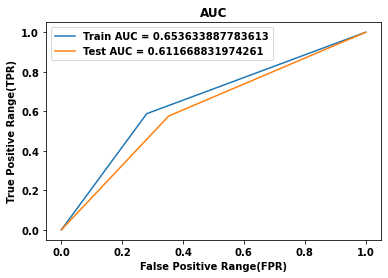

In [159]:
dt = DecisionTreeClassifier(criterion='gini',class_weight='balanced',max_depth=10,min_samples_split=500)
dt.fit(X=X_TFIDF_train,y=y_train)
y_train_pred = []
y_test_pred = []
for j in range(0,X_TFIDF_train.shape[0],100):
    y_train_pred.extend(dt.predict(X=X_TFIDF_train.tocsr()[j:j+100]))
for j in range(0,X_TFIDF_test.shape[0],100):
    y_test_pred.extend(dt.predict(X=X_TFIDF_test.tocsr()[j:j+100]))
train_fpr, train_tpr, thresholds = roc_curve(y_train,y_train_pred)
test_fpr, test_tpr, thresholds = roc_curve(y_test,y_test_pred)

plt.plot(train_fpr,train_tpr,label = "Train AUC = "+str(auc(train_fpr,train_tpr)))
plt.plot(test_fpr,test_tpr, label = "Test AUC = "+str(auc(test_fpr,test_tpr)))
TFIDF_train_auc = auc(train_fpr,train_tpr)
TFIDF_test_auc = auc(test_fpr,test_tpr)
plt.legend()
plt.xlabel('False Positive Range(FPR)')
plt.ylabel('True Positive Range(TPR)')
plt.title('AUC')
plt.show()

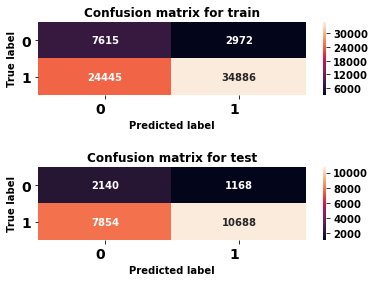

In [160]:
cnf_matrix_train = confusion_matrix(y_train,y_train_pred)
cnf_matrix_test = confusion_matrix(y_test,y_test_pred)
classes = [0,1]
df_cm_train = pd.DataFrame(cnf_matrix_train, columns=classes, index = classes)
df_cm_test = pd.DataFrame(cnf_matrix_test, columns=classes, index=classes)
plt.subplot(211)
try:
    heatmap = sns.heatmap(df_cm_train,annot=True,fmt="d")
except ValueError:
    raise ValueError('Confusion matrix values must be integers')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion matrix for train')

plt.subplot(212)
try:
    heatmap = sns.heatmap(df_cm_test,annot=True,fmt="d")
except ValueError:
    raise ValueError('Confusion matrix values must be integers')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion matrix for test')
plt.subplots_adjust(hspace=1)

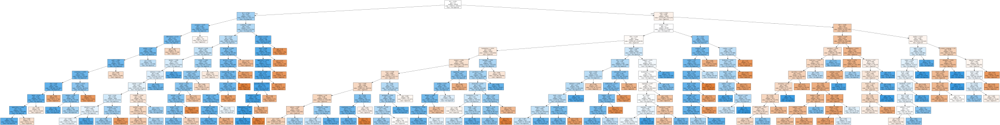

In [161]:
dot_data = tree.export_graphviz(dt,out_file=None,feature_names=tfidf_features,class_names=['Approved','Not Approved'],filled=True)
graph = graphviz.Source(dot_data,format='png')
graph

In [162]:
X_test_copy = X_test.copy()
X_test_copy = X_test_copy.assign(y_predicted = np.round(y_test_pred),y_actual = y_test)
false_positives = X_test_copy[(X_test_copy.y_predicted == 1) & (X_test_copy.y_actual == 0)]
false_positives.drop(['y_predicted','y_actual'],axis=1,inplace=True)
false_positives_essaytext = ' '.join(false_positives['essay'])
false_positives_essaytext

'students learners leaders artists school students across city come together music integrated project based learning community academic classes students participate thematic learning expeditions engage real world issues coach create high quality real world products every student also belongs orchestra receives daily instruction instrument many students come low income families might not otherwise able afford private music lessons orchestral program makes music accessible every child school students using assortment creative materials create sculptures inspired weather climate data spending three months learning weather patterns climate science analyzing data sets historical projected weather patterns considering local implications continued climate change students use work boston based artist nathalie miebach inspiration creating metaphorical representations newfound scientific knowledge base students work local artists learn intentionality artists bring even abstract looking work stud

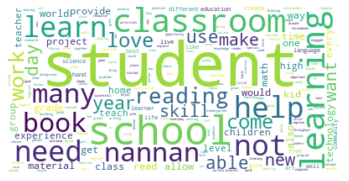

In [163]:
word_cloud = WordCloud(collocations=False,background_color='white',stopwords=stopwords).generate(false_positives_essaytext)
plt.imshow(word_cloud,interpolation='bilinear')
plt.axis('off')
plt.show()

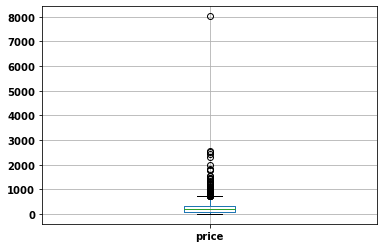

In [164]:
boxplot = false_positives.boxplot(column='price')

<AxesSubplot:xlabel='teacher_number_of_previously_posted_projects'>

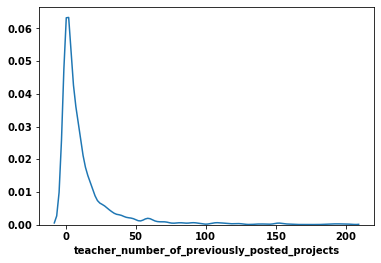

In [165]:
sns.distplot(false_positives['teacher_number_of_previously_posted_projects'],hist=False,kde=True)

In [166]:
X_TFIDF_train_top5k = X_TFIDF_train.copy().tocsr()
X_TFIDF_cv_top5k = X_TFIDF_cv.copy().tocsr()
X_TFIDF_test_top5k = X_TFIDF_test.copy().tocsr()
importances = dt.feature_importances_
sorted_indices = np.argsort(importances)[::-1]
first5k_indices = sorted_indices[:5000]
X_TFIDF_train_top5k = X_TFIDF_train_top5k[:,first5k_indices]
X_TFIDF_cv_top5k = X_TFIDF_cv_top5k[:,first5k_indices]
X_TFIDF_test_top5k = X_TFIDF_test_top5k[:,first5k_indices]
print(X_TFIDF_train_top5k.shape)
print(X_TFIDF_cv_top5k.shape)
print(X_TFIDF_test_top5k.shape)

(69918, 5000)
(17480, 5000)
(21850, 5000)


In [167]:
max_depth = [1, 5, 10, 50, 100, 500]
min_samples_split = [5, 10, 100, 500]
hyperparameters = dict(max_depth = max_depth, min_samples_split = min_samples_split)
dt = DecisionTreeClassifier(criterion='entropy',class_weight='balanced')
clf = GridSearchCV(estimator=dt,param_grid=hyperparameters,cv=10,scoring='roc_auc',return_train_score=True,n_jobs = -1)
best_model = clf.fit(X=X_TFIDF_train_top5k,y=y_train)
print('Best max_depth:', best_model.best_estimator_.get_params()['max_depth'])
print('Best min_samples_split:', best_model.best_estimator_.get_params()['min_samples_split'])
train_auc_scores = clf.cv_results_['mean_train_score']
cv_auc_scores = clf.cv_results_['mean_test_score']
min_samples_split_list = [param['min_samples_split'] for param in clf.cv_results_['params']]
max_depth_list = [param['max_depth'] for param in clf.cv_results_['params']]

Best max_depth: 10
Best min_samples_split: 500


In [168]:
trace1 = go.Scatter3d(x=min_samples_split_list,y=max_depth_list,z=train_auc_scores, name = 'Train')
trace2 = go.Scatter3d(x=min_samples_split_list,y=max_depth_list,z=cv_auc_scores, name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='min samples split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

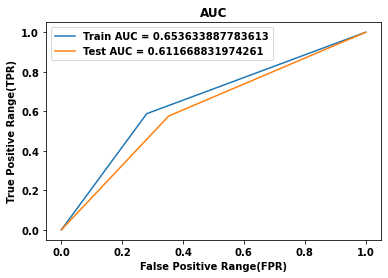

In [169]:
dt = DecisionTreeClassifier(criterion='gini',class_weight='balanced',max_depth=10,min_samples_split=500)
dt.fit(X=X_TFIDF_train_top5k,y=y_train)
y_train_pred = []
y_test_pred = []
for j in range(0,X_TFIDF_train_top5k.shape[0],100):
    y_train_pred.extend(dt.predict(X=X_TFIDF_train_top5k.tocsr()[j:j+100]))
for j in range(0,X_TFIDF_test_top5k.shape[0],100):
    y_test_pred.extend(dt.predict(X=X_TFIDF_test_top5k.tocsr()[j:j+100]))
train_fpr, train_tpr, thresholds = roc_curve(y_train,y_train_pred)
test_fpr, test_tpr, thresholds = roc_curve(y_test,y_test_pred)

plt.plot(train_fpr,train_tpr,label = "Train AUC = "+str(auc(train_fpr,train_tpr)))
plt.plot(test_fpr,test_tpr, label = "Test AUC = "+str(auc(test_fpr,test_tpr)))
TFIDF_top5k_train_auc = auc(train_fpr,train_tpr)
TFIDF_top5k_test_auc = auc(test_fpr,test_tpr)
plt.legend()
plt.xlabel('False Positive Range(FPR)')
plt.ylabel('True Positive Range(TPR)')
plt.title('AUC')
plt.show()

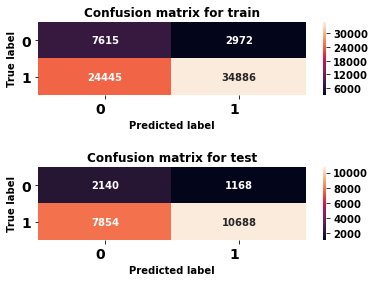

In [170]:
cnf_matrix_train = confusion_matrix(y_train,y_train_pred)
cnf_matrix_test = confusion_matrix(y_test,y_test_pred)
classes = [0,1]
df_cm_train = pd.DataFrame(cnf_matrix_train, columns=classes, index = classes)
df_cm_test = pd.DataFrame(cnf_matrix_test, columns=classes, index=classes)
plt.subplot(211)
try:
    heatmap = sns.heatmap(df_cm_train,annot=True,fmt="d")
except ValueError:
    raise ValueError('Confusion matrix values must be integers')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion matrix for train')

plt.subplot(212)
try:
    heatmap = sns.heatmap(df_cm_test,annot=True,fmt="d")
except ValueError:
    raise ValueError('Confusion matrix values must be integers')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion matrix for test')
plt.subplots_adjust(hspace=1)

### 2.4.2 Applying DT on TFIDF W2V,<font color='red'> SET 2</font>

In [0]:
# Please write all the code with proper documentation

In [147]:
max_depth = [1, 5, 10, 50, 100, 500]
min_samples_split = [5, 10, 100, 500]
hyperparameters = dict(max_depth = max_depth, min_samples_split = min_samples_split)
dt = DecisionTreeClassifier(criterion='entropy',class_weight='balanced')
clf = GridSearchCV(estimator=dt,param_grid=hyperparameters,cv=10,scoring='roc_auc',return_train_score=True,n_jobs = -1)
best_model = clf.fit(X=X_tfidf_w2v_train,y=y_train)
print('Best max_depth:', best_model.best_estimator_.get_params()['max_depth'])
print('Best min_samples_split:', best_model.best_estimator_.get_params()['min_samples_split'])
train_auc_scores = clf.cv_results_['mean_train_score']
cv_auc_scores = clf.cv_results_['mean_test_score']
min_samples_split_list = [param['min_samples_split'] for param in clf.cv_results_['params']]
max_depth_list = [param['max_depth'] for param in clf.cv_results_['params']]

Best max_depth: 5
Best min_samples_split: 500


In [148]:
trace1 = go.Scatter3d(x=min_samples_split_list,y=max_depth_list,z=train_auc_scores, name = 'Train')
trace2 = go.Scatter3d(x=min_samples_split_list,y=max_depth_list,z=cv_auc_scores, name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='min samples split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

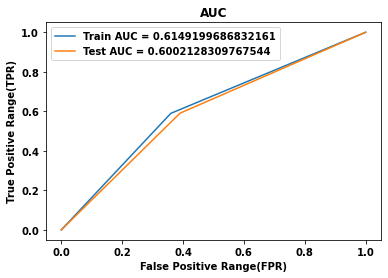

In [149]:
dt = DecisionTreeClassifier(criterion='gini',class_weight='balanced',max_depth=5,min_samples_split=500)
dt.fit(X=X_tfidf_w2v_train,y=y_train)
y_train_pred = []
y_test_pred = []
for j in range(0,X_tfidf_w2v_train.shape[0],100):
    y_train_pred.extend(dt.predict(X=X_tfidf_w2v_train.tocsr()[j:j+100]))
for j in range(0,X_tfidf_w2v_test.shape[0],100):
    y_test_pred.extend(dt.predict(X=X_tfidf_w2v_test.tocsr()[j:j+100]))
train_fpr, train_tpr, thresholds = roc_curve(y_train,y_train_pred)
test_fpr, test_tpr, thresholds = roc_curve(y_test,y_test_pred)

plt.plot(train_fpr,train_tpr,label = "Train AUC = "+str(auc(train_fpr,train_tpr)))
plt.plot(test_fpr,test_tpr, label = "Test AUC = "+str(auc(test_fpr,test_tpr)))
TFIDF_w2v_train_auc = auc(train_fpr,train_tpr)
TFIDF_w2v_test_auc = auc(test_fpr,test_tpr)
plt.legend()
plt.xlabel('False Positive Range(FPR)')
plt.ylabel('True Positive Range(TPR)')
plt.title('AUC')
plt.show()

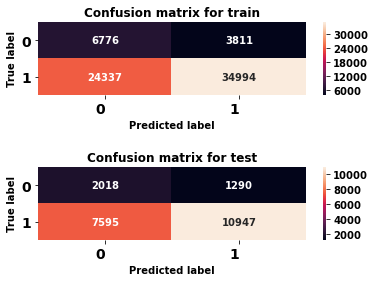

In [150]:
cnf_matrix_train = confusion_matrix(y_train,y_train_pred)
cnf_matrix_test = confusion_matrix(y_test,y_test_pred)
classes = [0,1]
df_cm_train = pd.DataFrame(cnf_matrix_train, columns=classes, index = classes)
df_cm_test = pd.DataFrame(cnf_matrix_test, columns=classes, index=classes)
plt.subplot(211)
try:
    heatmap = sns.heatmap(df_cm_train,annot=True,fmt="d")
except ValueError:
    raise ValueError('Confusion matrix values must be integers')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion matrix for train')

plt.subplot(212)
try:
    heatmap = sns.heatmap(df_cm_test,annot=True,fmt="d")
except ValueError:
    raise ValueError('Confusion matrix values must be integers')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(),rotation = 0,ha = "right", fontsize = 14)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion matrix for test')
plt.subplots_adjust(hspace=1)

In [151]:
X_test_copy = X_test.copy()
X_test_copy = X_test_copy.assign(y_predicted = np.round(y_test_pred),y_actual = y_test)
false_positives = X_test_copy[(X_test_copy.y_predicted == 1) & (X_test_copy.y_actual == 0)]
false_positives.drop(['y_predicted','y_actual'],axis=1,inplace=True)
false_positives_essaytext = ' '.join(false_positives['essay'])
false_positives_essaytext

'kindergarten magical time discovery every child life get discover student discover joys reading writing discover world around math science social studies community nestled woods outskirts anchorage alaska oftentimes overlooked travelers pride lending helping hand neighbors raising children ways community service gratitude school reflects ideology way raise students care respect honesty would like ability allow students open exploration time practice using senses safe environment current resources children access sensory materials bring specific lessons rarely opportunities explore due time restraints students need hands montessori manipulatives education tool engaging play stimulation providing students hands montessori center able provide engaging interactive lessons children involved education nannan students eager learners attend public elementary school high standards students educators 32 4th graders mission school provide challenging environment promotes learning achievement stu

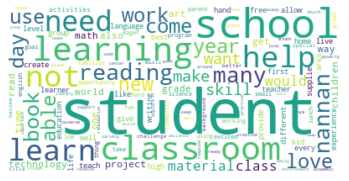

In [152]:
word_cloud = WordCloud(collocations=False,background_color='white',stopwords=stopwords).generate(false_positives_essaytext)
plt.imshow(word_cloud,interpolation='bilinear')
plt.axis('off')
plt.show()

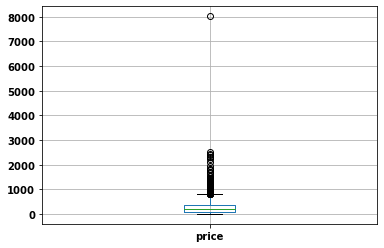

In [153]:
boxplot = false_positives.boxplot(column='price')

<AxesSubplot:xlabel='teacher_number_of_previously_posted_projects'>

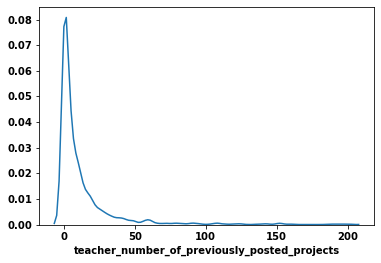

In [154]:
sns.distplot(false_positives['teacher_number_of_previously_posted_projects'],hist=False,kde=True)

<h1>3. Conclusions</h1>

In [0]:
# Please compare all your models using Prettytable library

In [171]:
from prettytable import PrettyTable
table = PrettyTable(['Vectorizer','Max Depth','Min Samples Split','Train AUC','Test AUC'])
table.add_row(['TFIDF','10','500',TFIDF_train_auc,TFIDF_test_auc])
table.add_row(['Top5k','10','500',TFIDF_top5k_train_auc,TFIDF_top5k_test_auc])
table.add_row(['TFIDF_w2v','5','500',TFIDF_w2v_train_auc,TFIDF_w2v_test_auc])

print(table)

+------------+-----------+-------------------+--------------------+--------------------+
| Vectorizer | Max Depth | Min Samples Split |     Train AUC      |      Test AUC      |
+------------+-----------+-------------------+--------------------+--------------------+
|   TFIDF    |     10    |        500        | 0.653633887783613  | 0.611668831974261  |
|   Top5k    |     10    |        500        | 0.653633887783613  | 0.611668831974261  |
| TFIDF_w2v  |     5     |        500        | 0.6149199686832161 | 0.6002128309767544 |
+------------+-----------+-------------------+--------------------+--------------------+
